##Extraction of Data from DATASETS

In [ ]:
from IPython.display import Image, display
import numpy as np
from os.path import join
import pandas as pd
import tensorflow as tf
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.impute import SimpleImputer
from sklearn.pipeline import make_pipeline
from sklearn.compose import make_column_transformer
from sklearn.model_selection import GroupShuffleSplit
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras import callbacks

In [ ]:
df_org = pd.read_csv('/content/datasets.csv')

df_org.head()

,Dataset,Camera,Category,Author,Organisation/Project,Source,Dataset link,Images,Size in GB (est.),Ground Truth,License,License link,SampleImage,Image Format,DOI,Masks,Description
0,AvignonHotelDesMonnaies,Canon EOS 5D Mark II,Building,Romuald Perrot rperrot,NaN,https://github.com/rperrot/ReconstructionDataSet,https://github.com/rperrot/ReconstructionDataS...,11.0,"0,176",no,Attribution-NonCommercial 3.0 Unported,https://github.com/rperrot/ReconstructionDataS...,https://github.com/rperrot/ReconstructionDataS...,JPG,NaN,NaN,Hotel des Monnaies facade building in Avignon ...
1,BoutevilleWindowDetail,Canon EOS 5D Mark II,Building,Romuald Perrot rperrot,NaN,https://github.com/rperrot/ReconstructionDataSet,https://github.com/rperrot/ReconstructionDataS...,26.0,"0,416",no,Attribution-NonCommercial 3.0 Unported,https://github.com/rperrot/ReconstructionDataS...,https://github.com/rperrot/ReconstructionDataS...,JPG,NaN,NaN,Upper window detail of Bouteville Castle (France)
2,BurgosPuertaDeLaCoroneria,Canon EOS 5D Mark II,Building,Romuald Perrot rperrot,NaN,https://github.com/rperrot/ReconstructionDataSet,https://github.com/rperrot/ReconstructionDataS...,10.0,"0,16",no,Attribution-NonCommercial 3.0 Unported,https://github.com/rperrot/ReconstructionDataS...,https://github.com/rperrot/ReconstructionDataS...,JPG,NaN,NaN,North Transept Portal of Burgos Cathedral
3,CognacGardenBuilding,Canon EOS 5D Mark II,Building,Romuald Perrot rperrot,NaN,https://github.com/rperrot/ReconstructionDataSet,https://github.com/rperrot/ReconstructionDataS...,12.0,"0,192",no,Attribution-NonCommercial 3.0 Unported,https://github.com/rperrot/ReconstructionDataS...,https://github.com/rperrot/ReconstructionDataS...,JPG,NaN,NaN,Cognac Garden Building image set
4,CognacStJacquesDoor,Canon EOS 5D Mark II,Building,Romuald Perrot rperrot,NaN,https://github.com/rperrot/ReconstructionDataSet,https://github.com/rperrot/ReconstructionDataS...,19.0,"0,304",no,Attribution-NonCommercial 3.0 Unported,https://github.com/rperrot/ReconstructionDataS...,https://github.com/rperrot/ReconstructionDataS...,JPG,NaN,NaN,Saint Jacques Door at cognac City


In [ ]:
df_org.shape

(356, 17)

In [ ]:
df = df_org.copy()
df = df.dropna(axis=0, subset=['Source'])
df.head()

,Dataset,Camera,Category,Author,Organisation/Project,Source,Dataset link,Images,Size in GB (est.),Ground Truth,License,License link,SampleImage,Image Format,DOI,Masks,Description
0,AvignonHotelDesMonnaies,Canon EOS 5D Mark II,Building,Romuald Perrot rperrot,NaN,https://github.com/rperrot/ReconstructionDataSet,https://github.com/rperrot/ReconstructionDataS...,11.0,"0,176",no,Attribution-NonCommercial 3.0 Unported,https://github.com/rperrot/ReconstructionDataS...,https://github.com/rperrot/ReconstructionDataS...,JPG,NaN,NaN,Hotel des Monnaies facade building in Avignon ...
1,BoutevilleWindowDetail,Canon EOS 5D Mark II,Building,Romuald Perrot rperrot,NaN,https://github.com/rperrot/ReconstructionDataSet,https://github.com/rperrot/ReconstructionDataS...,26.0,"0,416",no,Attribution-NonCommercial 3.0 Unported,https://github.com/rperrot/ReconstructionDataS...,https://github.com/rperrot/ReconstructionDataS...,JPG,NaN,NaN,Upper window detail of Bouteville Castle (France)
2,BurgosPuertaDeLaCoroneria,Canon EOS 5D Mark II,Building,Romuald Perrot rperrot,NaN,https://github.com/rperrot/ReconstructionDataSet,https://github.com/rperrot/ReconstructionDataS...,10.0,"0,16",no,Attribution-NonCommercial 3.0 Unported,https://github.com/rperrot/ReconstructionDataS...,https://github.com/rperrot/ReconstructionDataS...,JPG,NaN,NaN,North Transept Portal of Burgos Cathedral
3,CognacGardenBuilding,Canon EOS 5D Mark II,Building,Romuald Perrot rperrot,NaN,https://github.com/rperrot/ReconstructionDataSet,https://github.com/rperrot/ReconstructionDataS...,12.0,"0,192",no,Attribution-NonCommercial 3.0 Unported,https://github.com/rperrot/ReconstructionDataS...,https://github.com/rperrot/ReconstructionDataS...,JPG,NaN,NaN,Cognac Garden Building image set
4,CognacStJacquesDoor,Canon EOS 5D Mark II,Building,Romuald Perrot rperrot,NaN,https://github.com/rperrot/ReconstructionDataSet,https://github.com/rperrot/ReconstructionDataS...,19.0,"0,304",no,Attribution-NonCommercial 3.0 Unported,https://github.com/rperrot/ReconstructionDataS...,https://github.com/rperrot/ReconstructionDataS...,JPG,NaN,NaN,Saint Jacques Door at cognac City


In [ ]:
df.shape

(338, 17)

In [ ]:
import requests
from io import BytesIO
from PIL import Image

for i in range(100):
  r = requests.get(df['Source'][i])
  print("Status:", r.status_code)
  print(r.url)

Status: 200
https://github.com/rperrot/ReconstructionDataSet
Status: 200
https://github.com/rperrot/ReconstructionDataSet
Status: 200
https://github.com/rperrot/ReconstructionDataSet
Status: 200
https://github.com/rperrot/ReconstructionDataSet
Status: 200
https://github.com/rperrot/ReconstructionDataSet
Status: 200
https://github.com/rperrot/ReconstructionDataSet
Status: 200
https://github.com/rperrot/ReconstructionDataSet
Status: 200
https://github.com/rperrot/ReconstructionDataSet
Status: 200
https://github.com/rperrot/ReconstructionDataSet
Status: 200
https://github.com/natowi/dataset_flowerpot
Status: 200
https://github.com/alicevision/dataset_monstree
Status: 200
https://github.com/alicevision/dataset_monstree
Status: 200
https://github.com/alicevision/dataset_monstree
Status: 200
https://github.com/alicevision/dataset_buddha
Status: 200
https://github.com/alicevision/dataset_buddha
Status: 200
https://peterfalkingham.com/resources/
Status: 200
https://peterfalkingham.com/resource

In [ ]:
Source_df = df.filter(['Dataset', 'Author', 'Source', 'Dataset link', 'DOI', 'Description'], axis=1)
Source_df.head()

,Dataset,Author,Source,Dataset link,DOI,Description
0,AvignonHotelDesMonnaies,Romuald Perrot rperrot,https://github.com/rperrot/ReconstructionDataSet,https://github.com/rperrot/ReconstructionDataS...,NaN,Hotel des Monnaies facade building in Avignon ...
1,BoutevilleWindowDetail,Romuald Perrot rperrot,https://github.com/rperrot/ReconstructionDataSet,https://github.com/rperrot/ReconstructionDataS...,NaN,Upper window detail of Bouteville Castle (France)
2,BurgosPuertaDeLaCoroneria,Romuald Perrot rperrot,https://github.com/rperrot/ReconstructionDataSet,https://github.com/rperrot/ReconstructionDataS...,NaN,North Transept Portal of Burgos Cathedral
3,CognacGardenBuilding,Romuald Perrot rperrot,https://github.com/rperrot/ReconstructionDataSet,https://github.com/rperrot/ReconstructionDataS...,NaN,Cognac Garden Building image set
4,CognacStJacquesDoor,Romuald Perrot rperrot,https://github.com/rperrot/ReconstructionDataSet,https://github.com/rperrot/ReconstructionDataS...,NaN,Saint Jacques Door at cognac City


In [ ]:
!unzip Bird_snow_UK.zip

Archive:  Bird_snow_UK.zip
warning [Bird_snow_UK.zip]:  168 extra bytes at beginning or within zipfile
  (attempting to process anyway)
  inflating: Bird _snow _UK/[002618].jpg  
  inflating: Bird _snow _UK/[002619].jpg  
  inflating: Bird _snow _UK/[002620].jpg  
  inflating: Bird _snow _UK/[002621].jpg  
  inflating: Bird _snow _UK/[002622].jpg  
  inflating: Bird _snow _UK/[002623].jpg  
  inflating: Bird _snow _UK/[002625].jpg  
  inflating: Bird _snow _UK/[002626].jpg  


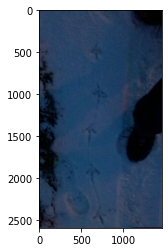

In [ ]:
from skimage import io

img = io.imread('/content/Bird _snow _UK/[002618].jpg')
plt.imshow(img)

In [ ]:
import os
list = os.listdir('/content/Bird _snow _UK')
for i in range(len(list)):
  print(list[i])

[002623].jpg
[002625].jpg
[002619].jpg
[002626].jpg
[002620].jpg
[002622].jpg
[002618].jpg
[002621].jpg


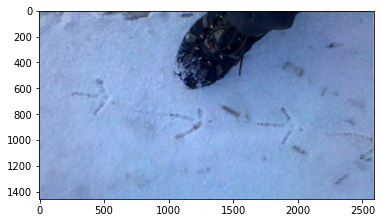

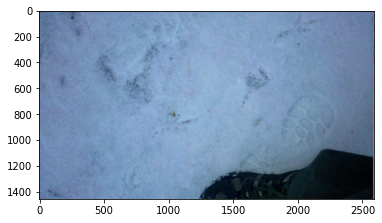

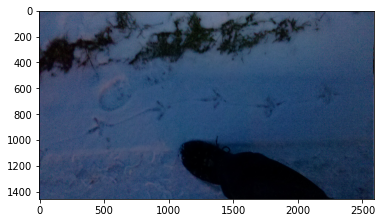

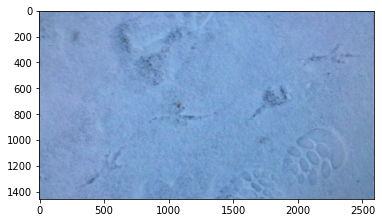

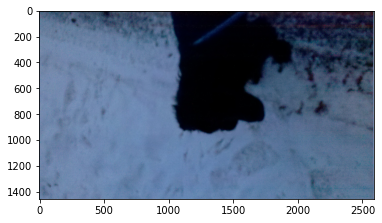

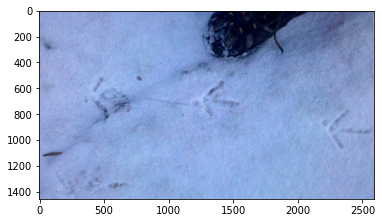

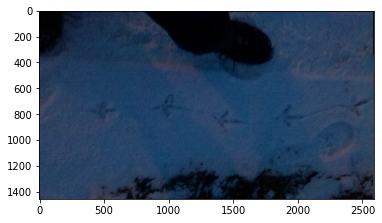

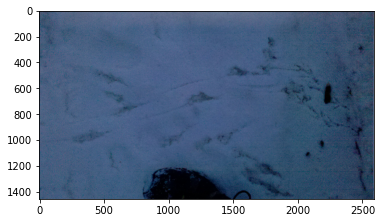

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

def process(filename):
    image = mpimg.imread('/content/Bird _snow _UK/'+filename)
    plt.figure()
    plt.imshow(image)

for file in list:
    process(file)

In [ ]:
!unzip Dog_sand_tenerife.zip

Archive:  Dog_sand_tenerife.zip
   creating: Dog _sand _tenerife/model/
  inflating: Dog _sand _tenerife/model/Dog _sand _tenerife.jpg  
  inflating: Dog _sand _tenerife/model/Dog _sand _tenerife.mtl  
  inflating: Dog _sand _tenerife/model/Dog _sand _tenerife.obj  
  inflating: Dog _sand _tenerife/model/Dog _Sand _Tenerife.psz  
   creating: Dog _sand _tenerife/photos/
  inflating: Dog _sand _tenerife/photos/OLYMPUS DIGITAL CAMERA_1867.jpg  
  inflating: Dog _sand _tenerife/photos/OLYMPUS DIGITAL CAMERA_1868.jpg  
  inflating: Dog _sand _tenerife/photos/OLYMPUS DIGITAL CAMERA_1869.jpg  
  inflating: Dog _sand _tenerife/photos/OLYMPUS DIGITAL CAMERA_1870.jpg  
  inflating: Dog _sand _tenerife/photos/OLYMPUS DIGITAL CAMERA_1871.jpg  
  inflating: Dog _sand _tenerife/photos/OLYMPUS DIGITAL CAMERA_1872.jpg  


In [ ]:
import os
list = os.listdir('/content/Dog _sand _tenerife/photos')
for i in range(len(list)):
  print(list[i])

OLYMPUS DIGITAL CAMERA_1872.jpg
OLYMPUS DIGITAL CAMERA_1870.jpg
OLYMPUS DIGITAL CAMERA_1867.jpg
OLYMPUS DIGITAL CAMERA_1868.jpg
OLYMPUS DIGITAL CAMERA_1871.jpg
OLYMPUS DIGITAL CAMERA_1869.jpg


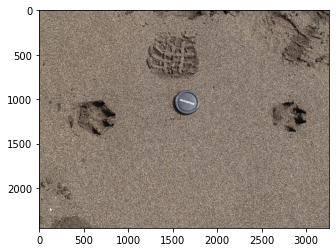

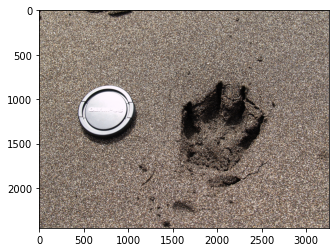

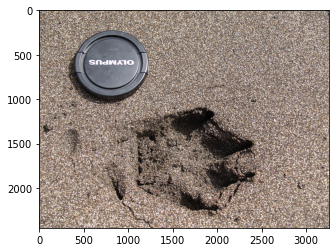

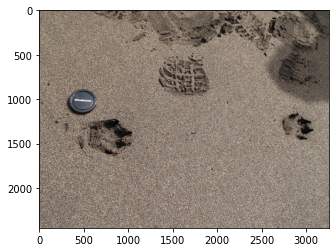

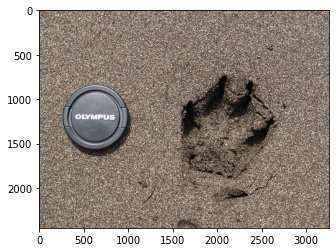

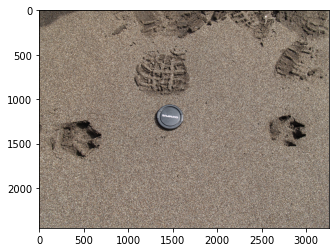

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

def process(filename):
    image = mpimg.imread('/content/Dog _sand _tenerife/photos/'+filename)
    plt.figure()
    plt.imshow(image)

for file in list:
    process(file)

In [ ]:
import os
list = os.listdir('/content/Dog _sand _tenerife/model')
for i in range(len(list)):
  print(list[i])

Dog _sand _tenerife.obj
Dog _sand _tenerife.mtl
Dog _sand _tenerife.jpg
Dog _Sand _Tenerife.psz


##Orthorectification

###Difference between images with different feature
**Gives the difference between images as Mean Squared Error value**

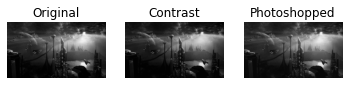

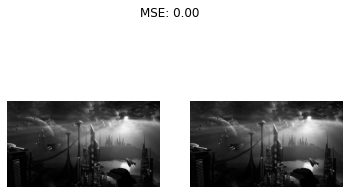

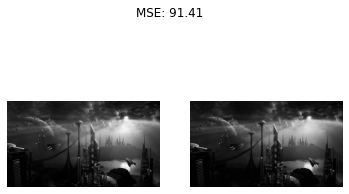

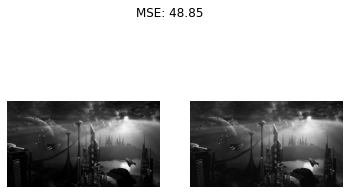

In [ ]:
# import the necessary packages
# from skimage.measure import structural_similarity as ssim
import matplotlib.pyplot as plt
import numpy as np
import cv2

def mse(imageA, imageB):
	# the 'Mean Squared Error' between the two images is the
	# sum of the squared difference between the two images;
	# NOTE: the two images must have the same dimension
	err = np.sum((imageA.astype("float") - imageB.astype("float")) ** 2)
	err /= float(imageA.shape[0] * imageA.shape[1])
	
	# return the MSE, the lower the error, the more "similar"
	# the two images are
	return err
def compare_images(imageA, imageB, title):
	# compute the mean squared error and structural similarity
	# index for the images
	m = mse(imageA, imageB)
	# s = ssim(imageA, imageB)

	fig = plt.figure(title)
	plt.suptitle("MSE: %.2f" % (m))
  # plt.suptitle("MSE: %.2f, SSIM: %.2f" % (m, s))

	# show first image
	ax = fig.add_subplot(1, 2, 1)
	plt.imshow(imageA, cmap = plt.cm.gray)
	plt.axis("off")
 
	# show the second image
	ax = fig.add_subplot(1, 2, 2)
	plt.imshow(imageB, cmap = plt.cm.gray)
	plt.axis("off")
 
	# show the images
	plt.show()

"""
# load the images -- the original, the original + contrast,
# and the original + photoshop
"""
original = cv2.imread("/content/Org.jpeg")
contrast = cv2.imread("/content/Cont.jpeg")
shopped = cv2.imread("/content/PShop.jpeg")

# convert the images to grayscale
original = cv2.cvtColor(original, cv2.COLOR_BGR2GRAY)
contrast = cv2.cvtColor(contrast, cv2.COLOR_BGR2GRAY)
shopped = cv2.cvtColor(shopped, cv2.COLOR_BGR2GRAY)

# initialize the figure
fig = plt.figure("Images")
images = ("Original", original), ("Contrast", contrast), ("Photoshopped", shopped)

# loop over the images
for (i, (name, image)) in enumerate(images):

	ax = fig.add_subplot(1, 3, i + 1)
	ax.set_title(name)
	plt.imshow(image, cmap = plt.cm.gray)
	plt.axis("off")

plt.show()

compare_images(original, original, "Original vs. Original")
compare_images(original, contrast, "Original vs. Contrast")
compare_images(original, shopped, "Original vs. Photoshopped")

In [ ]:
from PIL import Image
from PIL import ImageChops
from PIL import ImageDraw

imageA= Image.open("Org.jpeg")
imageB= Image.open("Cont.jpeg")

dif = ImageChops.difference(imageB, imageA).getbbox()
draw = ImageDraw.Draw(imageB)
draw.rectangle(dif)
imageB.show()

###Image Resizing and Scaling

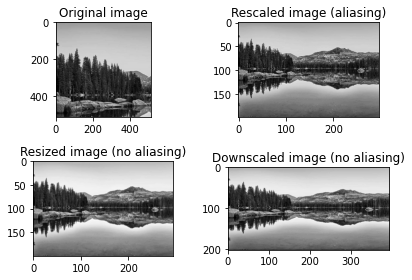

In [ ]:
import matplotlib.pyplot as plt
import cv2
from skimage import data, color
from skimage.transform import rescale, resize, downscale_local_mean

img = cv2.imread('left.jpg')
image = color.rgb2gray(img)

image_rescaled = rescale(image, 0.25, anti_aliasing=False)
image_resized = resize(image, (image.shape[0] // 4, image.shape[1] // 4),
                       anti_aliasing=True)
image_downscaled = downscale_local_mean(image, (4, 3))

fig, axes = plt.subplots(nrows=2, ncols=2)

ax = axes.ravel()

ax[0].imshow(image, cmap='gray')
ax[0].set_title("Original image")

ax[1].imshow(image_rescaled, cmap='gray')
ax[1].set_title("Rescaled image (aliasing)")

ax[2].imshow(image_resized, cmap='gray')
ax[2].set_title("Resized image (no aliasing)")

ax[3].imshow(image_downscaled, cmap='gray')
ax[3].set_title("Downscaled image (no aliasing)")

ax[0].set_xlim(0, 512)
ax[0].set_ylim(512, 0)
plt.tight_layout()
plt.show()

###Image Stitching
**Forming a relevant image**

In [48]:
!pip install opencv-python==3.4.2.16 &> /dev/null
!pip install opencv-contrib-python==3.4.2.16 &> /dev/null

-1

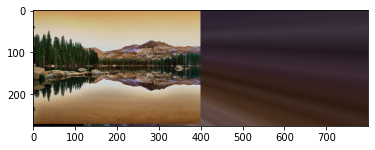

In [ ]:
import argparse
import imutils
import cv2
import numpy as np
import matplotlib.pyplot as plt

class Stitcher:
    def __init__(self):
        self.isv3 = imutils.is_cv3(or_better=True)

    def stitch(self, images, ratio=0.75, reprojThresh=4.0, showMatches=False):
        (imageB, imageA) = images
        (kpsA, featuresA) = self.detectAndDescribe(imageA)
        (kpsB, featuresB) = self.detectAndDescribe(imageB)
        M = self.matchKeypoints(kpsA, kpsB,
                            featuresA, featuresB, ratio, reprojThresh)
        if M is None:
            return None
        (matches, H, status) = M
        result = cv2.warpPerspective(imageA, H, (imageA.shape[1] + imageB.shape[1], imageA.shape[0]))
        result[0:imageB.shape[0], 0:imageB.shape[1]] = imageB
        if showMatches:
            vis = self.drawMatches(imageA, imageB, kpsA, kpsB, matches, status)
            return (result, vis)
        return result

    def detectAndDescribe(self, image):
        gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
        if self.isv3:
            descriptor = cv2.xfeatures2d.SIFT_create()
            (kps, features) = descriptor.detectAndCompute(image, None)
        else:
            detector = cv2.FeatureDetector_create("SIFT")
            kps = detector.detect(gray)
            extractor = cv2.DescriptorExtractor_create("SIFT")
            (kps, features) = extractor.compute(gray, kps)
        kps = np.float32([kp.pt for kp in kps])
        return (kps, features)
    
    
    def matchKeypoints(self, kpsA, kpsB, featuresA, featuresB, ratio, reprojThresh):
        matcher = cv2.DescriptorMatcher_create("BruteForce")
        rawMatches = matcher.knnMatch(featuresA, featuresB, 2)
        matches = []
        for m in rawMatches:
            if len(m) == 2 and m[0].distance < m[1].distance * ratio:
                matches.append((m[0].trainIdx, m[0].queryIdx))
        if len(matches) > 4:
            ptsA = np.float32([kpsA[i] for (_, i) in matches])
            ptsB = np.float32([kpsB[i] for (i, _) in matches])
            (H, status) = cv2.findHomography(ptsA, ptsB, cv2.RANSAC, reprojThresh)
            return (matches, H, status)
        return None
    
    
    def drawMatches(self, imageA, imageB, kpsA, kpsB, matches, status):
        (hA, wA) = imageA.shape[:2]
        (hB, wB) = imageB.shape[:2]
        vis = np.zeros((max(hA, hB), wA + wB, 3), dtype="uint8")
        vis[0:hA, 0:wA] = imageA
        vis[0:hB, wA:] = imageB
        for ((trainIdx, queryIdx), s) in zip(matches, status):
            if s == 1:
                ptA = (int(kpsA[queryIdx][0]), int(kpsA[queryIdx][1]))
                ptB = (int(kpsB[trainIdx][0]) + wA, int(kpsB[trainIdx][1]))
                cv2.line(vis, ptA, ptB, (0, 255, 0), 1)
        return vis


# construct the argument parse and parse the arguments
# ap = argparse.ArgumentParser()
# ap.add_argument("-f", "--first", required=True,help="path to the first image")
# ap.add_argument("-s", "--second", required=True,help="path to the second image")
# args = vars(ap.parse_args())
# load the two images and resize them to have a width of 400 pixels
# (for faster processing)

imageA = cv2.imread("/content/left.jpg")
imageB = cv2.imread("/content/right.jpg")
imageA = imutils.resize(imageA, width=400)
imageB = imutils.resize(imageB, width=400)


# stitch the images together to create a panorama
stitcher = Stitcher()
(result, vis) = stitcher.stitch([imageA, imageB], showMatches=True)


# show the images
plt.imshow(imageA)
plt.imshow(imageB)
plt.imshow(vis)
plt.imshow(result)
cv2.waitKey(0)

Test failed

###Stitching images

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import imageio
import imutils
cv2.ocl.setUseOpenCL(False)

In [ ]:
# select the image id (valid values 1,2,3, or 4)
feature_extractor = 'orb' # one of 'sift', 'surf', 'brisk', 'orb'
feature_matching = 'bf'

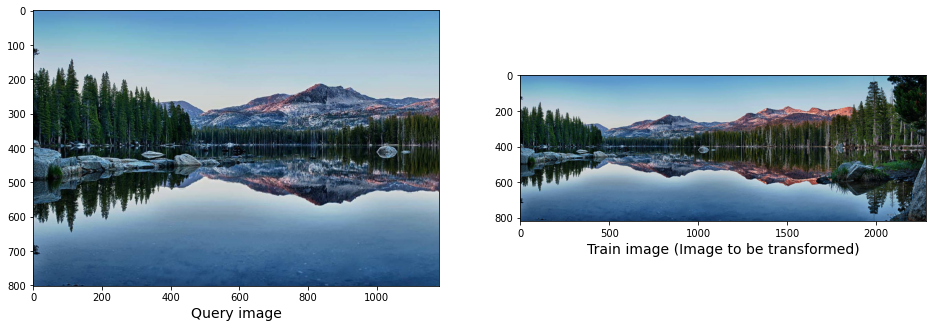

In [ ]:
# read images and transform them to grayscale
# Make sure that the train image is the image that will be transformed
trainImg = imageio.imread('/content/image.jpg')
trainImg_gray = cv2.cvtColor(trainImg, cv2.COLOR_RGB2GRAY)

queryImg = imageio.imread('/content/left.jpg')
# Opencv defines the color channel in the order BGR. 
# Transform it to RGB to be compatible to matplotlib
queryImg_gray = cv2.cvtColor(queryImg, cv2.COLOR_RGB2GRAY)

fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, constrained_layout=False, figsize=(16,9))
ax1.imshow(queryImg, cmap="gray")
ax1.set_xlabel("Query image", fontsize=14)

ax2.imshow(trainImg, cmap="gray")
ax2.set_xlabel("Train image (Image to be transformed)", fontsize=14)

plt.show()

In [ ]:
def detectAndDescribe(image, method=None):
    """
    Compute key points and feature descriptors using an specific method
    """
    
    assert method is not None, "You need to define a feature detection method. Values are: 'sift', 'surf'"
    
    # detect and extract features from the image
    if method == 'sift':
        descriptor = cv2.xfeatures2d.SIFT_create()
    elif method == 'surf':
        descriptor = cv2.xfeatures2d.SURF_create()
    elif method == 'brisk':
        descriptor = cv2.BRISK_create()
    elif method == 'orb':
        descriptor = cv2.ORB_create()
        
    # get keypoints and descriptors
    (kps, features) = descriptor.detectAndCompute(image, None)
    
    return (kps, features)

In [ ]:
kpsA, featuresA = detectAndDescribe(trainImg_gray, method=feature_extractor)
kpsB, featuresB = detectAndDescribe(queryImg_gray, method=feature_extractor)

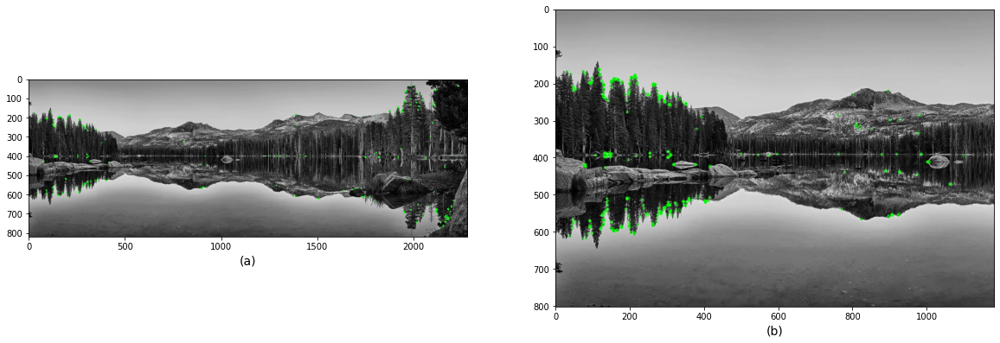

In [ ]:
# display the keypoints and features detected on both images
fig, (ax1,ax2) = plt.subplots(nrows=1, ncols=2, figsize=(20,8), constrained_layout=False)
ax1.imshow(cv2.drawKeypoints(trainImg_gray,kpsA,None,color=(0,255,0)))
ax1.set_xlabel("(a)", fontsize=14)
ax2.imshow(cv2.drawKeypoints(queryImg_gray,kpsB,None,color=(0,255,0)))
ax2.set_xlabel("(b)", fontsize=14)

plt.show()

In [ ]:
def createMatcher(method,crossCheck):
    "Create and return a Matcher Object"
    
    if method == 'sift' or method == 'surf':
        bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=crossCheck)
    elif method == 'orb' or method == 'brisk':
        bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=crossCheck)
    return bf

In [ ]:
def matchKeyPointsBF(featuresA, featuresB, method):
    bf = createMatcher(method, crossCheck=True)
        
    # Match descriptors.
    best_matches = bf.match(featuresA,featuresB)
    
    # Sort the features in order of distance.
    # The points with small distance (more similarity) are ordered first in the vector
    rawMatches = sorted(best_matches, key = lambda x:x.distance)
    print("Raw matches (Brute force):", len(rawMatches))
    return rawMatches

In [ ]:
def matchKeyPointsKNN(featuresA, featuresB, ratio, method):
    bf = createMatcher(method, crossCheck=False)
    # compute the raw matches and initialize the list of actual matches
    rawMatches = bf.knnMatch(featuresA, featuresB, 2)
    print("Raw matches (knn):", len(rawMatches))
    matches = []

    # loop over the raw matches
    for m,n in rawMatches:
        # ensure the distance is within a certain ratio of each
        # other (i.e. Lowe's ratio test)
        if m.distance < n.distance * ratio:
            matches.append(m)
    return matches

Using: bf feature matcher
Raw matches (Brute force): 270


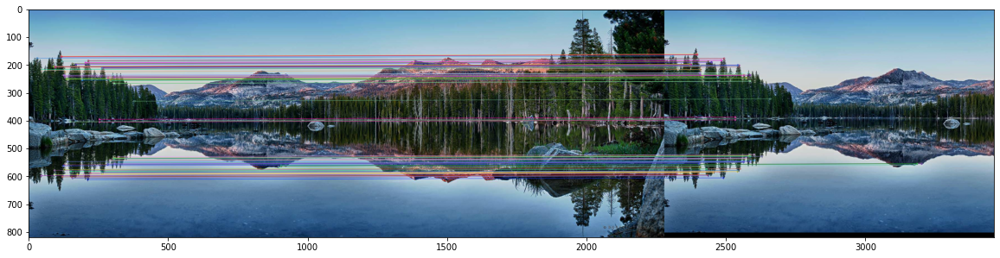

In [ ]:
print("Using: {} feature matcher".format(feature_matching))

fig = plt.figure(figsize=(20,8))

if feature_matching == 'bf':
    matches = matchKeyPointsBF(featuresA, featuresB, method=feature_extractor)
    img3 = cv2.drawMatches(trainImg,kpsA,queryImg,kpsB,matches[:100],
                           None,flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
elif feature_matching == 'knn':
    matches = matchKeyPointsKNN(featuresA, featuresB, ratio=0.75, method=feature_extractor)
    img3 = cv2.drawMatches(trainImg,kpsA,queryImg,kpsB,np.random.choice(matches,100),
                           None,flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
    

plt.imshow(img3)
plt.show()

In [ ]:
def getHomography(kpsA, kpsB, featuresA, featuresB, matches, reprojThresh):
    # convert the keypoints to numpy arrays
    kpsA = np.float32([kp.pt for kp in kpsA])
    kpsB = np.float32([kp.pt for kp in kpsB])
    
    if len(matches) > 4:

        # construct the two sets of points
        ptsA = np.float32([kpsA[m.queryIdx] for m in matches])
        ptsB = np.float32([kpsB[m.trainIdx] for m in matches])
        
        # estimate the homography between the sets of points
        (H, status) = cv2.findHomography(ptsA, ptsB, cv2.RANSAC,
            reprojThresh)

        return (matches, H, status)
    else:
        return None

In [ ]:
M = getHomography(kpsA, kpsB, featuresA, featuresB, matches, reprojThresh=4)
if M is None:
    print("Error!")
(matches, H, status) = M
print(H)

[[ 9.97287908e-01 -1.35540688e-03  5.17465171e-01]
 [ 2.25342401e-04  9.95441094e-01 -7.52404630e+00]
 [-4.07848928e-07 -6.72769251e-06  1.00000000e+00]]


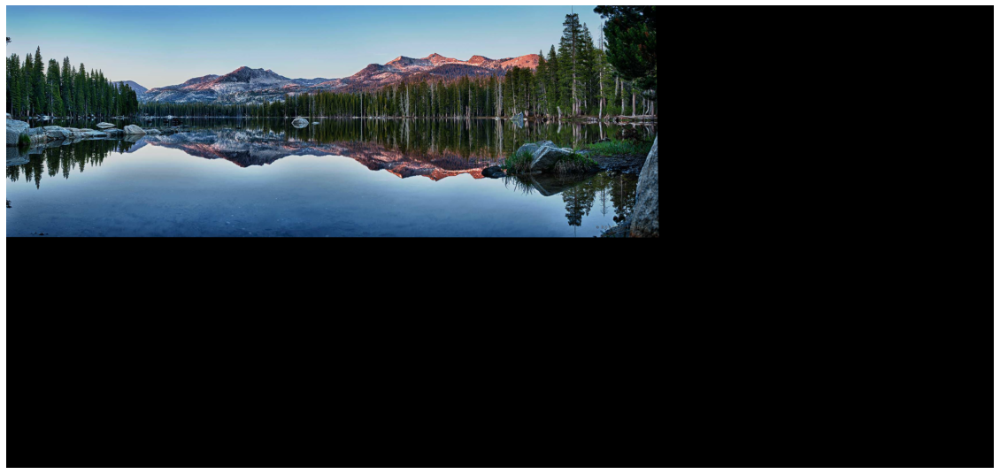

In [ ]:
# Apply panorama correction
width = trainImg.shape[1] + queryImg.shape[1]
height = trainImg.shape[0] + queryImg.shape[0]

result = cv2.warpPerspective(trainImg, H, (width, height))
result[0:queryImg.shape[0], 0:queryImg.shape[1]] = queryImg

plt.figure(figsize=(20,10))
plt.imshow(result)

plt.axis('off')
plt.show()

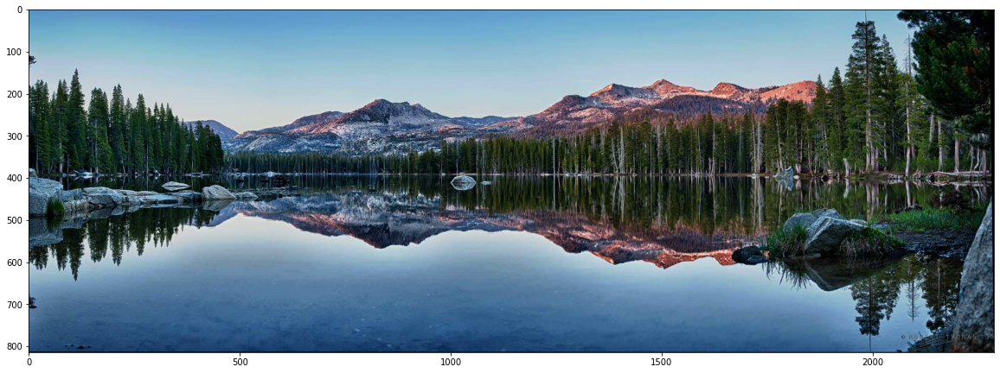

In [ ]:
# transform the panorama image to grayscale and threshold it 
gray = cv2.cvtColor(result, cv2.COLOR_BGR2GRAY)
thresh = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY)[1]

# Finds contours from the binary image
cnts = cv2.findContours(thresh.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
cnts = imutils.grab_contours(cnts)

# get the maximum contour area
c = max(cnts, key=cv2.contourArea)

# get a bbox from the contour area
(x, y, w, h) = cv2.boundingRect(c)

# crop the image to the bbox coordinates
result = result[y:y + h, x:x + w]

# show the cropped image
plt.figure(figsize=(20,10))
plt.imshow(result)

Experiment (Stitching) successful

##Working on aerial dataset

In [ ]:
get_ipython().system_raw("unrar x Village_Dataset.rar")

**List of all images**

In [ ]:
import os
list = os.listdir('/content/Village_Dataset/geotagged-images')
for i in range(len(list)):
  print(list[i])

IMG_7733.JPG
IMG_7752.JPG
IMG_7730.JPG
IMG_7729.JPG
IMG_7731.JPG
IMG_7724.JPG
IMG_7742.JPG
IMG_7734.JPG
IMG_7726.JPG
IMG_7725.JPG
IMG_7755.JPG
IMG_7723.JPG
IMG_7743.JPG
IMG_7722.JPG
IMG_7747.JPG
IMG_7741.JPG
IMG_7727.JPG
IMG_7720.JPG
IMG_7728.JPG
IMG_7721.JPG
IMG_7739.JPG
IMG_7753.JPG
IMG_7749.JPG
IMG_7744.JPG
IMG_7719.JPG
IMG_7746.JPG
IMG_7740.JPG
IMG_7736.JPG
IMG_7750.JPG
IMG_7748.JPG
IMG_7738.JPG
IMG_7737.JPG
IMG_7732.JPG
IMG_7745.JPG
IMG_7751.JPG
IMG_7735.JPG
IMG_7754.JPG


**Displaying all the images available in the aerial dataset**

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


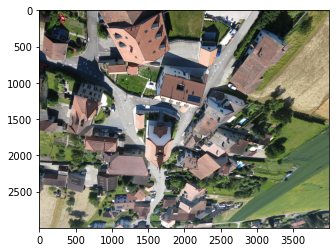

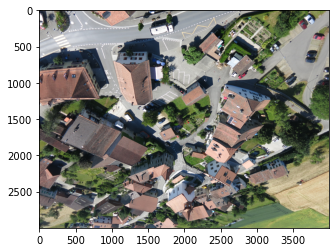

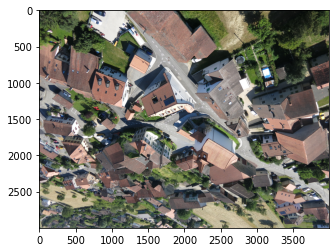

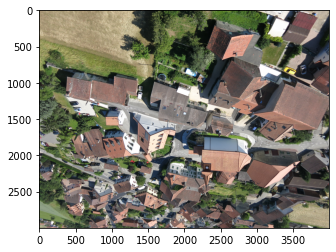

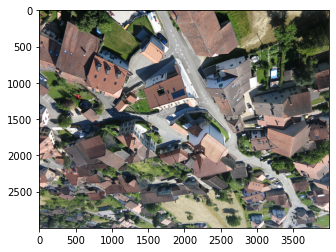

...

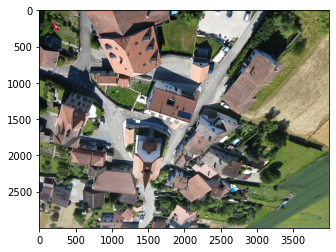

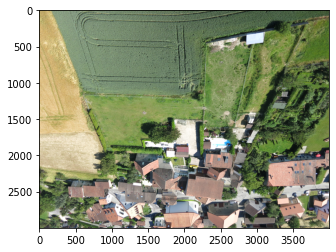

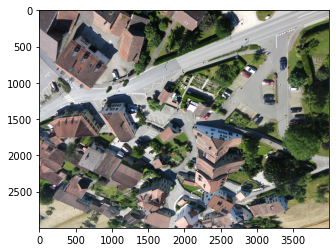

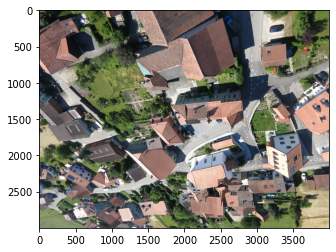

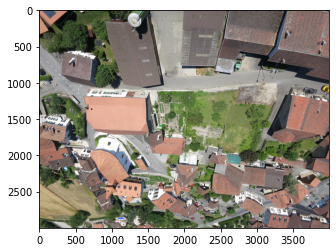

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

def process(filename):
    image = mpimg.imread('/content/Village_Dataset/geotagged-images/'+filename)
    plt.figure()
    plt.imshow(image)

for file in list:
    process(file)

In [ ]:
get_ipython().system_raw("unrar x Village_Dataset/Other/flight_trajectories.rar")

In [ ]:
from bs4 import BeautifulSoup

inputfile = "2014_06_20_oblique_sullens3_1.kml"
with open(inputfile, 'r') as f:
  soup = BeautifulSoup(f)

  for node in soup.find_all('description'):
    for item in node.find_all('td'):
      print(item.string)

###Extracting the GeoData from the above images

In [47]:
!pip install pykml &> /dev/null

In [2]:
from pykml import parser
import pandas as pd

filename='2014_06_20_oblique_sullens3_1.kml'
with open(filename) as f:
    folder = parser.parse(f).getroot().Document.Folder

plnm=[]
cordi=[]
for pm in folder.Placemark:
    plnm1=pm.name
    plcs1=pm.Point.coordinates
    plnm.append(plnm1.text)
    cordi.append(plcs1.text)
    
db1=pd.DataFrame()
db1['place_name']=plnm
db1['cordinates']=cordi

def dump(obj):
    for attr in dir(obj):
        if hasattr( obj, attr ):
            print( "obj.%s = %s" % (attr, getattr(obj, attr)))
            
db1['Longitude'], db1['Latitude'],db1['value'] = zip(*db1['cordinates'].apply(lambda x: x.split(',', 2)))

db1

,place_name,cordinates,Longitude,Latitude,value
0,None,"6.5670203000,46.5934472000,664.8247070312",6.5670203000,46.5934472000,664.8247070312
1,None,"6.5671063000,46.5934188000,664.5999755859",6.5671063000,46.5934188000,664.5999755859
2,None,"6.5672096000,46.5934516000,662.0398559570",6.5672096000,46.5934516000,662.0398559570
3,None,"6.5680086000,46.5935641000,662.7901611328",6.5680086000,46.5935641000,662.7901611328
4,None,"6.5684652000,46.5941925000,664.9379882812",6.5684652000,46.5941925000,664.9379882812
5,None,"6.5681463000,46.5947760000,666.2438964844",6.5681463000,46.5947760000,666.2438964844
6,None,"6.5676289000,46.5949972000,662.5949096680",6.5676289000,46.5949972000,662.5949096680
7,None,"6.5674940000,46.5950195000,665.4377441406",6.5674940000,46.5950195000,665.4377441406
8,None,"6.5674492000,46.5950642000,664.2429809570",6.5674492000,46.5950642000,664.2429809570
9,None,"6.5673749000,46.5950406000,665.0639038086",6.5673749000,46.5950406000,665.0639038086


In [3]:
from pykml import parser
import pandas as pd

filename='2014_06_20_oblique_sullens3_2.kml'
with open(filename) as f:
    folder = parser.parse(f).getroot().Document.Folder

plnm=[]
cordi=[]
for pm in folder.Placemark:
    plnm1=pm.name
    plcs1=pm.Point.coordinates
    plnm.append(plnm1.text)
    cordi.append(plcs1.text)
    
db2=pd.DataFrame()
db2['place_name']=plnm
db2['cordinates']=cordi

def dump(obj):
    for attr in dir(obj):
        if hasattr( obj, attr ):
            print( "obj.%s = %s" % (attr, getattr(obj, attr)))
            
db2['Longitude'], db2['Latitude'],db2['value'] = zip(*db2['cordinates'].apply(lambda x: x.split(',', 2)))

db2

,place_name,cordinates,Longitude,Latitude,value
0,None,"6.5665905000,46.5931782000,659.0663452148",6.5665905000,46.5931782000,659.0663452148
1,None,"6.5671072000,46.5930792000,658.2584228516",6.5671072000,46.5930792000,658.2584228516
2,None,"6.5672139000,46.5932007000,657.9384765625",6.5672139000,46.5932007000,657.9384765625
3,None,"6.5686966000,46.5938169000,652.0129394531",6.5686966000,46.5938169000,652.0129394531
4,None,"6.5689817000,46.5941797000,658.3817138672",6.5689817000,46.5941797000,658.3817138672
5,None,"6.5690028000,46.5942863000,659.7321777344",6.5690028000,46.5942863000,659.7321777344
6,None,"6.5689634000,46.5947930000,661.6210937500",6.5689634000,46.5947930000,661.6210937500
7,None,"6.5680573000,46.5954726000,660.4630737305",6.5680573000,46.5954726000,660.4630737305
8,None,"6.5676923000,46.5955196000,660.5871582031",6.5676923000,46.5955196000,660.5871582031
9,None,"6.5661441000,46.5949151000,656.7766113281",6.5661441000,46.5949151000,656.7766113281


**Combining two DataFrames into a single one**

In [7]:
db = pd.concat([db1,db2], axis=0)
db.reset_index(drop=True)

db

,place_name,cordinates,Longitude,Latitude,value
0,None,"6.5670203000,46.5934472000,664.8247070312",6.5670203000,46.5934472000,664.8247070312
1,None,"6.5671063000,46.5934188000,664.5999755859",6.5671063000,46.5934188000,664.5999755859
2,None,"6.5672096000,46.5934516000,662.0398559570",6.5672096000,46.5934516000,662.0398559570
3,None,"6.5680086000,46.5935641000,662.7901611328",6.5680086000,46.5935641000,662.7901611328
4,None,"6.5684652000,46.5941925000,664.9379882812",6.5684652000,46.5941925000,664.9379882812
5,None,"6.5681463000,46.5947760000,666.2438964844",6.5681463000,46.5947760000,666.2438964844
6,None,"6.5676289000,46.5949972000,662.5949096680",6.5676289000,46.5949972000,662.5949096680
7,None,"6.5674940000,46.5950195000,665.4377441406",6.5674940000,46.5950195000,665.4377441406
8,None,"6.5674492000,46.5950642000,664.2429809570",6.5674492000,46.5950642000,664.2429809570
9,None,"6.5673749000,46.5950406000,665.0639038086",6.5673749000,46.5950406000,665.0639038086


###Overlapping two images and forming a new Combined image

In [ ]:
from PIL import Image
import numpy as np

img = Image.open("/content/ROI.png")

background = Image.open("/content/Scan.jpg")

background.paste(img, (0, 0), img)
background.save('/content/Image.png',"PNG")

In [ ]:
import imutils
import matplotlib.pyplot as plt
import cv2

fg_img = cv2.imread("/content/Village_Dataset/geotagged-images/IMG_7752.JPG")
bg_img = cv2.imread("/content/Village_Dataset/geotagged-images/IMG_7744.JPG")

graybg = cv2.cvtColor(bg_img, cv2.COLOR_BGR2GRAY)

h1, w1 = fg_img.shape[:2]
print(h1, w1)

thresh = cv2.threshold(graybg, 225, 255, cv2.THRESH_BINARY)[1]
mask = thresh.copy()
mask = cv2.erode(mask, None, iterations=1)
mask2 = mask.copy()
mask2 = cv2.dilate(mask2, None, iterations = 2)
h2, w2 = mask2.shape[:2]
print(h2, w2)

cnts = cv2.findContours(mask2.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
cnts = imutils.grab_contours(cnts)

for c in cnts:
        x,y,w,h = cv2.boundingRect(c)
        pip_h = y 
        pip_w = x
        print(pip_h, pip_w)

        if h2 - pip_h > h1 + 1 and w2 - pip_w > w1 + 1:
                bg_img[pip_h:pip_h+h1,pip_w:pip_w+w1] = fg_img

        plt.imshow(bg_img)

cv2.waitKey(0)

3000 4000
3000 4000
2997 1191
2996 1510
2990 163
2984 3473
2984 3455
2984 3185
2975 3547
2974 3488
2972 2742
2970 2240
2969 3082
2966 2746
2966 1491
2965 1554
2964 3150
2964 1550
2963 3158
2960 306
2956 338
2953 2702
2950 337
2949 273
2948 3110
2946 2201
2944 1552
2944 467
2941 565
2938 827
2937 2137
2937 358
2935 1535
2935 1023
2935 805
2934 312
2930 819
2928 1558
2926 1156
2925 351
2919 1541
2917 265
2916 2680
2915 2695
2915 2455
2914 470
2913 1158
2912 2667
2909 1318
2907 778
2907 574
2907 208
2905 1552
2904 3058
2904 240
2897 1265
2897 212
2895 2108
2892 584
2890 215
2888 1921
2888 796
2888 579
2888 240
2884 2780
2884 181
2882 163
2879 2944
2877 1534
2877 236
2876 3737
2875 2292
2873 245
2872 1101
2872 346
2870 567
2870 193
2868 3474
2867 1159
2866 1102
2865 3464
2865 1536
2863 2419
2863 566
2861 1453
2859 1236
2857 1003
2857 996
2851 3477
2851 930
2850 1035
2847 3778
2847 909
2845 868
2841 1487
2841 1075
2839 1207
2836 2859
2832 2394
2830 3092
2829 1363
2827 3052
2825 2783
2800 25

3000 4000
The new combined-image:



-1

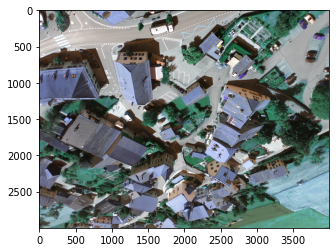

In [46]:
import cv2
import matplotlib.pyplot as plt
import numpy as np

fg_img = cv2.imread("/content/Village_Dataset/geotagged-images/IMG_7752.JPG")
bg_img = cv2.imread("/content/Village_Dataset/geotagged-images/IMG_7744.JPG")

plt.imshow(fg_img)
plt.imshow(bg_img)

h1, w1 = fg_img.shape[:2]
print (h1, w1)

pip_h = 0
pip_w = 0

bg_img[pip_h:pip_h+h1,pip_w:pip_w+w1] = fg_img
print("The new combined-image:\n")
plt.imshow(bg_img)
cv2.waitKey(0)

**Similarly, select another 2 images and then combine them using this algorithm**

####Analysing the image density of the selected images one-by-one

(3000, 4000, 3)


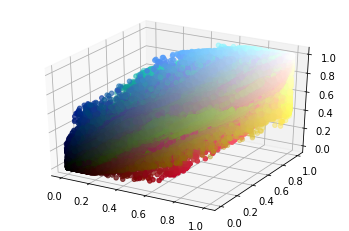

In [13]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

image = plt.imread('/content/Village_Dataset/geotagged-images/IMG_7752.JPG')
im = image/255.0
print(im.shape)

pixels = im.reshape(im.shape[0]*im.shape[1], im.shape[2])

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.scatter(pixels[:,0], pixels[:,1], pixels[:,2], c=pixels)
plt.show() 

(3000, 4000, 3)


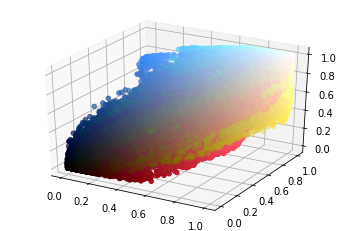

In [15]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

image = plt.imread('/content/Village_Dataset/geotagged-images/IMG_7744.JPG')
im = image/255.0
print(im.shape)

pixels = im.reshape(im.shape[0]*im.shape[1], im.shape[2])

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.scatter(pixels[:,0], pixels[:,1], pixels[:,2], c=pixels)
plt.show() 

####Tracking location of this village on World Map

In [33]:
!pip install geopandas &> /dev/null

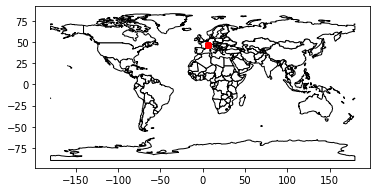

In [44]:
import geopandas as gpd
import folium
from folium import Choropleth, Circle, Marker
from folium.plugins import HeatMap, MarkerCluster

gdf = gpd.GeoDataFrame(db, geometry=gpd.points_from_xy(db.Longitude, db.Latitude))

world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))

ax = world.plot(color='white', edgecolor='black')

gdf.plot(ax=ax, color='red')

plt.show()